In [1]:
# %matplotlib widget


In [2]:
import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.ticker import FuncFormatter, MultipleLocator, LogLocator
import matplotlib.colors as colors
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [17]:
sns.set_context("paper",font_scale=2.)

### Parameters to plot for discrete

#### TANH

In [19]:
import matplotlib.colors as colors
import matplotlib.cbook as cbook
class MidpointNormalize(colors.Normalize):
    def __init__(self, vmin=None, vmax=None, vcenter=None, clip=False):
        self.vcenter = vcenter
        colors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        # I'm ignoring masked values and all kinds of edge cases to make a
        # simple example...
        x, y = [self.vmin, self.vcenter, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y))

In [20]:

cmap = sns.diverging_palette(220, 20, sep=20, as_cmap=True)

In [18]:
tmp = np.load('LE_rnn_tanh.npz')
thetas = tmp['thetas']
alphas = tmp['alphas']
LE1 = tmp['LE1'].reshape(len(thetas),len(alphas))
LE2 = tmp['LE2'].reshape(len(thetas),len(alphas))

tmp = np.load('frequency_rnn_tanh.npz')
thetas2 = tmp['thetas_tanh']
alphas2 = tmp['rad_tanh']
freqs = tmp['frequencies_tanh'].reshape(len(thetas2),len(alphas2))

freqs = 1./np.ma.array(freqs, mask = freqs==0)
LE1copy = LE1
LE1 = np.ma.array(LE1, mask = np.isinf(LE1))
LE2 = np.ma.array(LE2, mask = np.isinf(LE2))

Text(0, 0.5, 'Radius $\\alpha$')

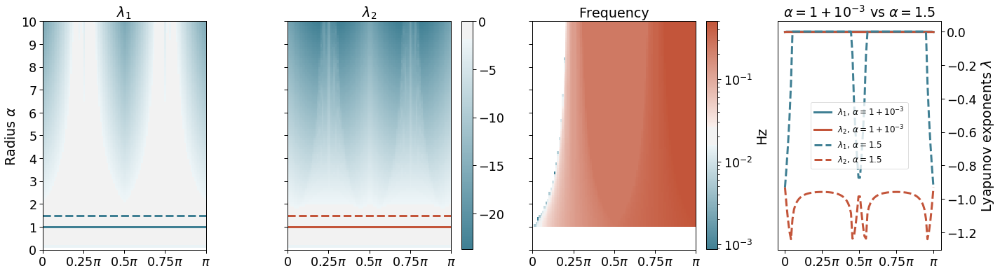

In [21]:
ncols = 4
width = 6
fig,ax = plt.subplots(nrows=1, ncols=ncols, figsize=(ncols*width,width))

# f1 = ax[0].pcolor(thetas,alphas,LE1.T,cmap=cmap, vmax=0., vmin=np.min(LE2))

midnorm = MidpointNormalize(vmin=np.min(LE2), vcenter=0.001, vmax=np.max(LE1))
f1 = ax[0].pcolor(thetas,alphas,LE1.T,cmap=cmap, norm=midnorm)

ax[0].set_title(r'$\lambda_{1}$')


# f2 =ax[1].pcolor(thetas,alphas,LE2.T,cmap=cmap, vmax=0., vmin=np.min(LE2))
f2 =ax[1].pcolor(thetas,alphas,LE2.T,cmap=cmap, norm=midnorm)


ax[1].set_title(r'$\lambda_{2}$')
fig.colorbar(f2, ax=ax[1], orientation='vertical')


f3 = ax[2].pcolor(thetas2,alphas2,freqs.T,cmap=cmap,
                 norm=colors.LogNorm(vmin=freqs.min(), vmax=0.5))
ax[2].set_title(r'Frequency',fontsize=28)
fig.colorbar(f3, ax=ax[2], orientation='vertical',label="Hz")


ax[0].get_shared_x_axes().join(ax[0], ax[1])
ax[0].get_shared_x_axes().join(ax[0], ax[2])

ax[0].get_shared_y_axes().join(ax[0], ax[1])
ax[0].get_shared_y_axes().join(ax[0], ax[2])
for i in range(3):
    ax[i].set_yticklabels([])
    ax[i].set_ylim([0.,10.])
    ax[i].yaxis.set_major_formatter(FuncFormatter(
   lambda val,pos: '{:.2g}'.format(val)))
    ax[i].yaxis.set_major_locator(MultipleLocator(base=1.))
    if i>0:
        ax[i].yaxis.set_ticklabels([])
#     ax[i].set_aspect(np.pi/10)
for i in range(4):
    ax[i].xaxis.set_major_formatter(FuncFormatter(
   lambda val,pos: '{:.2g}$\pi$'.format(val/np.pi) if val !=0 and val/np.pi!=1. else ('0' if val==0  else '$\pi$')))
    ax[i].xaxis.set_major_locator(MultipleLocator(base=0.25*np.pi))








ax[0].plot(thetas, np.ones_like(thetas)*alphas[idx_approx1], linestyle="solid", color=colorL1,linewidth=3.0)
ax[1].plot(thetas, np.ones_like(thetas)*alphas[idx_approx1], linestyle="solid", color=colorL2,linewidth=3.0)

ax[0].plot(thetas, np.ones_like(thetas)*1.5, linestyle="dashed", color=colorL1,linewidth=3.0)
ax[1].plot(thetas, np.ones_like(thetas)*1.5, linestyle="dashed", color=colorL2,linewidth=3.0)




ax[3].plot(thetas,LE1.T[idx_approx1,:], label=r'$\lambda_{1},\, \alpha = 1+10^{-3}$', color=colorL1,linewidth=3.0)
ax[3].plot(thetas,LE2.T[idx_approx1,:], label=r'$\lambda_{2},\, \alpha = 1+10^{-3}$', color=colorL2, linewidth=3.0)

ax[3].plot(thetas,LE1.T[idx_15,:],label=r'$\lambda_{1},\, \alpha = 1.5$', linestyle="dashed", color=colorL1, linewidth=3.0)
f4 = ax[3].plot(thetas,LE2.T[idx_15,:],label=r'$\lambda_{2},\, \alpha = 1.5$', linestyle="dashed", color=colorL2, linewidth=3.0)

ax[3].legend(fontsize=12)

ax[3].set_title(r"$\alpha = 1+10^{-3}$ vs $\alpha = 1.5$")
ax[3].yaxis.tick_right()
ax[3].yaxis.set_label_position("right")
ax[3].set_ylabel(r"Lyapunov exponents $\lambda$")
# ax[3].set_aspect(10/np.pi)

cbar = fig.colorbar(f2, ax=ax[3], orientation='vertical')
cbar.remove()
    
ax[0].set_ylabel(r"Radius $\alpha$")


In [ ]:
fig.savefig("Fig2_proposed_panel_b.pdf",dpi=600)

#### GRU

In [80]:
tmp = np.load('LE_rnn_gru.npz')
thetas = tmp['thetas']
alphas = tmp['alpha']
gates = tmp['gates']
LE1 = tmp['LE1'].reshape(len(gates),len(thetas),len(alphas))
LE2 = tmp['LE2'].reshape(len(gates),len(thetas),len(alphas))


tmp = np.load('frequency_rnn_gru.npz')
thetas2 = tmp['thetas_gru']
alphas2 = tmp['rad_gru']
gates2 = tmp['gates']
freqs = tmp['frequencies_gru'].reshape(len(thetas2),len(alphas2),len(gates2))

freqs = 1./np.ma.array(freqs, mask = freqs==0)
LE1 = np.ma.array(LE1, mask = np.isinf(LE1))
LE2 = np.ma.array(LE2, mask = np.isinf(LE2))

In [101]:
ncols = 2
fig,ax = plt.subplots(nrows=1, ncols=ncols, figsize=(ncols*6,6))
idx = 10
f1 = ax[0].pcolor(thetas,alphas,LE1[idx,:,:].T,cmap=sns.cm.rocket, ) #vmax=np.max(LE1), vmin=np.min(LE2)
f2 = ax[1].pcolor(thetas,alphas,LE2[idx,:,:].T,cmap=sns.cm.rocket, )

fig.colorbar(f2, ax=ax[1], orientation='vertical')

<ipython-input-101-f293b181dffa>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(nrows=1, ncols=ncols, figsize=(ncols*6,6))


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

### Params to check out for continuous time trajectories

In [10]:
tmp = np.load('LE_ode_tanh.npz')
thetas = tmp['thetas']
alphas = tmp['alpha']
LE1 = tmp['LE1'].reshape(len(thetas),len(alphas))
LE2 = tmp['LE2'].reshape(len(thetas),len(alphas))

tmp = np.load('frequency_ode_tanh.npz')
thetas2 = tmp['thetas_tanh']
alphas2 = tmp['rad_tanh']
freqs = tmp['frequencies_tanh'].reshape(len(alphas2),len(thetas2))
freqs = 1./np.ma.array(freqs, mask = freqs==0)

Text(0, 0.5, 'Radius $\\alpha$')

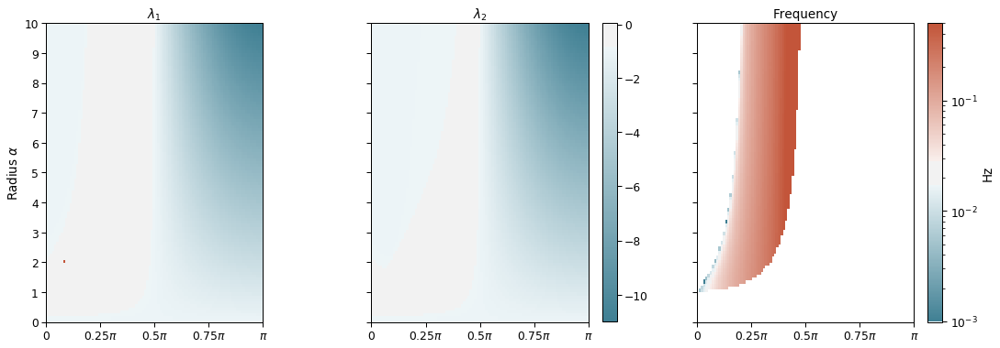

In [16]:
ncols = 3
fig,ax = plt.subplots(nrows=1, ncols=ncols, figsize=(ncols*6,6))

midnorm = MidpointNormalize(vmin=np.min(LE2), vcenter=np.max(LE1), vmax=np.max(LE1))
f1 = ax[0].pcolor(thetas,alphas,LE1.T,cmap=cmap,norm=midnorm)
ax[0].set_title(r'$\lambda_{1}$')
cbar = fig.colorbar(f1, ax=ax[0], orientation='vertical')
cbar.remove()
ax[0].set_title(r'$\lambda_{1}$')

f2 =ax[1].pcolor(thetas,alphas,LE2.T,cmap=cmap, norm=midnorm)

ax[1].set_title(r'$\lambda_{2}$')
fig.colorbar(f2, ax=ax[1], orientation='vertical')


f3 = ax[2].pcolor(thetas2,alphas2,freqs,cmap=cmap,
                 norm=colors.LogNorm(vmin=freqs.min(), vmax=0.5))
ax[2].set_title(r'Frequency')
fig.colorbar(f3, ax=ax[2], orientation='vertical',label="Hz")


ax[0].get_shared_x_axes().join(ax[0], ax[1])
ax[0].get_shared_x_axes().join(ax[0], ax[2])

ax[0].get_shared_y_axes().join(ax[0], ax[1])
ax[0].get_shared_y_axes().join(ax[0], ax[2])
# for i in range(1,3):

for i in range(3):
    ax[i].xaxis.set_major_formatter(FuncFormatter(
   lambda val,pos: '{:.2g}$\pi$'.format(val/np.pi) if val !=0 and val/np.pi!=1. else ('0' if val==0  else '$\pi$')))
    ax[i].xaxis.set_major_locator(MultipleLocator(base=0.25*np.pi))
    ax[i].set_yticklabels([])
    ax[i].set_ylim([0.,10.])
    ax[i].yaxis.set_major_formatter(FuncFormatter(
                                                   lambda val,pos: '{:.2g}'.format(val)))
    ax[i].yaxis.set_major_locator(MultipleLocator(base=1.))
    if i>0:
        ax[i].yaxis.set_ticklabels([])
    
    


ax[0].yaxis.set_major_formatter(FuncFormatter(
   lambda val,pos: '{:.2g}'.format(val)))
ax[0].yaxis.set_major_locator(MultipleLocator(base=1.))


ax[0].set_ylabel(r"Radius $\alpha$")

In [127]:
fig.savefig("Fig2_proposed_panel_a.pdf",dpi=600)